# IAPR 2026 — Final Project Report
## UNO Vision Challenge: Recovering Game State from Tabletop Snapshots

**Group:** `<group_id>` — `<kaggle_group_name>`

**Members:**
- `<Name 1>` — SCIPER `<xxxxxx>`
- `<Name 2>` — SCIPER `<xxxxxx>`
- `Dorian Besson` — SCIPER `346220`

---

> **How to read this report.** This is an executable
> walkthrough of our solution. Every section has pairs of explanations and plots of results related to the section. 

## 1. Problem statement

> The goal is to track a game of UNO, by anaylizing a snapshot of the game : identifying who the active player is, which cards each player holds and which card is in the center. There are up to 4 different players and tokens to indicate which player's turn it is to play. 
> No rules were broken in our project (hopefully) (no external data, no pretrained weights, <=12M params per model).

### 1.1 Training setup

> In order to have enough data to successfully train the NN we choose for our pipeline, we headed towards a solution that generated random scenes with similar structure to the final testing data that our Networks would face. In order to do that, we first manually cropped and masked all the individual reference cards to create qualitative data to be used by the scene generator.

### 1.2 Information extraction pipeline overview

Our solution is composed of five individual stages:

1. **Segmentation.** A small U-Net produces a per-pixel card-foreground
   probability map.
2. **Instance extraction.** Components are individualized and then slightly dilated while preventing them from merging 
   if the cards they represent overlap.
3. **Classification.** A masked 4-channel ResNet-18 (RGB + mask channel)
   classifies each crop into one of 54 UNO card types.
4. **Active-player token detection.** A deterministic OpenCV detector finds
   the dark rectangular token on plain backgrounds or the yellow round token
   on textured backgrounds, then maps its center to the fixed player sectors.
5. **Game-state assembly.** Boxes are assigned to a region (center, p1..p4)
   by geometry and written with the detected active player.

> We made the choice to separate cards classification and segmentation as we clearly thought that theses two information had little interactions, and that also allowed to choose more adapted NN structure to both of theses problems as they are not quite similar. One needs to classify different individual in discrete classes, the other ones try to guess the probabiliy of a cards existing in any location on an game snapshot.

> Though some foundation models are able to learn both shape, location and class all at once ('where' and 'what'), they typically require a lot of more data to train and therefore more computing power. Also, it can b more difficult to debug and interpret the results of such models.

In [1]:
%load_ext autoreload
%autoreload 2

import sys
from pathlib import Path

REPO_ROOT = Path.cwd().resolve()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

import cv2
import pandas as pd
from tqdm.auto import tqdm

from src.inference import (
    InferenceConfig,
    load_engine,
    predict_from_path,
    write_submission,
)

from src.data_augmentation import (
    CreateAugmentedDataConfig,
    initialize_create_augmented_data_pipeline,
    run_full_augmentation_pipeline,
    run_scene_preview,
    plot_scene_preview,
    summarize_augmented_data,
    print_augmentation_summary,
    plot_augmentation_overview,
)
from src.segmenter_training import (
    SegmenterPipelineConfig,
    run_full_segmenter_training,
    release_segmenter_training_resources,
    plot_training_curves,
    evaluate_segmenter_checkpoint,
    print_segmenter_summary,
    plot_segmenter_audit,
)
from src.classifier_training import (
    ClassifierPipelineConfig,
    run_full_classifier_training,
    plot_stage_preview,
    plot_classifier_training_curves,
    summarize_classifier_training,
    print_classifier_summary,
)
from src.report_viz import (
    BenchmarkConfig,
    run_labeled_benchmark,
    plot_pipeline_stages,
    plot_region_layout,
    plot_active_player_detection,
    summarize_active_player_detection,
    print_active_player_summary,
    plot_active_player_summary,
    summarize_prediction_set,
    print_prediction_set_summary,
    plot_prediction_set_diagnostics,
)

MODELS_DIR = REPO_ROOT / "models"
CHALLENGE_DIR = REPO_ROOT / "data" / "iapr-26-uno-vision-challenge"
TRAIN_DIR = CHALLENGE_DIR / "train_images"
TEST_DIR = CHALLENGE_DIR / "test_images"
TRAIN_CSV = CHALLENGE_DIR / "train.csv"

TRAINING_DATA_DIR = REPO_ROOT / "training_data"
OBJECT_LABELS_DIR = TRAINING_DATA_DIR / "object_labels"
AUGMENTED_DATA_DIR = TRAINING_DATA_DIR / "augmented_data"

GENERATED_SCENE_LABELS = OBJECT_LABELS_DIR / "augmented_scenes.json"
GENERATED_SCENE_IMAGES = AUGMENTED_DATA_DIR / "scene_images"
GENERATED_SCENE_MASKS = AUGMENTED_DATA_DIR / "scene_masks"
GENERATED_AUGMENTED_CARDS = OBJECT_LABELS_DIR / "augmented_cards.csv"

## 2. Compliance checks (R1–R6)

> As previously mentioned, our pipeline uses no external datasets
> and no pretrained weights, the test set is only used for inference, and
> both models fit under the 12M-parameter cap. Loading the engine below
> prints the trainable parameter count for each model.

In [2]:
engine = load_engine(MODELS_DIR, config=InferenceConfig(), verbose=True)

[compliance] SceneUNetSmall (segmenter): 1,928,417 trainable params
[compliance] CardClassifier[resnet18_small]: 9,853,134 trainable params
[engine] device=cuda | classes=54 | card_img_size=160 | seg_threshold=0.7


## 3. Training Data Generation

> The training set used by the two learned models is generated only from challenge assets: flat RGBA reference card crops, composited card
> augmentations, and synthetic full scenes with segmentation masks. The cell below contains the full regeneration call, but keeps the long
> write-heavy job of generating a full dataset like the ones we use for a complete training of the networks behing the RUN_FULL_AUGMENTATION
> flag.

### 3.1 Design choices

> We specifically and intentionnaly choose to generate masks with explicit separation between cards, particularily between overlapping cards. 
> This allows us to train the segmenter to learn of to individualise overlapping cards very easily without any complex structure or data input. We made sure every type of card (every color and number) could be found on any side of the game, so as for the model to 'not' learn that some specific cards are found in specific places in the scene. We also made sure to rotate the cards by several different random angles. Additionally, basic augmentations were used (hue, brightness, noise, Gaussian blur, contrast variations). Basically makng it as generalizable as possible. 

> The tuning of the width of the border is very important when generating the scene masks as the performances of the segmenter when finding overlapping cards will be greatly affected by it, and we also dont want as border so large that we loose significant information when predicting the masks that will be used for the classification. This is also the reason why we use dilation after the prediction has been done, we try to recover as much information as possible to give to the classifier.

Project root: C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do
Reference assets: 54 crops from C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do\training_data\reference_data\card_crops
Augmented-card output: C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do\training_data\augmented_data\card_images (*.jpg)
Scene output: C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do\training_data\augmented_data\scene_images (*.jpg)
Generating 54,000 augmented card crops with 8 thread worker(s)...


Card generation:   0%|          | 0/54000 [00:00<?, ?card/s]

Wrote 54,000 augmented-card rows -> C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do\training_data\object_labels\augmented_cards.csv
Generating 12,288 augmented scenes with 8 process worker(s)...


Scene generation:   0%|          | 0/12288 [00:00<?, ?scene/s]

Wrote 12,288 scene labels -> C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do\training_data\object_labels\augmented_scenes.json
Generated data: 54 reference crops, 54,000 augmented crops, 12,288 scenes/12,288 masks.
Coverage: 54 reference classes, 54 augmented classes, cards/scene mean=13.01 range=1-25, active={'p1': 2993, 'p3': 3084, 'p4': 3062, 'p2': 3149}.


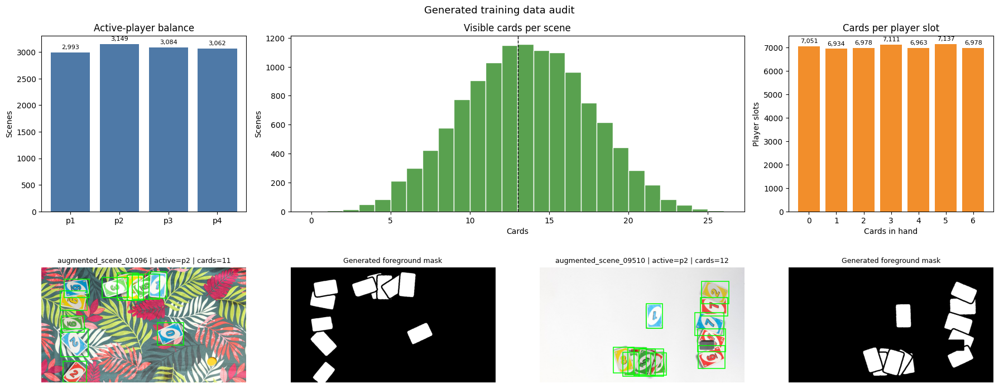

In [3]:
RUN_FULL_AUGMENTATION = True

augmentation_config = CreateAugmentedDataConfig(clear_output_dirs=RUN_FULL_AUGMENTATION)

if RUN_FULL_AUGMENTATION:
    augmentation_state = run_full_augmentation_pipeline(augmentation_config, project_root=REPO_ROOT)
else:
    augmentation_state = initialize_create_augmented_data_pipeline(augmentation_config, project_root=REPO_ROOT)
    augmentation_state = run_scene_preview(augmentation_state)
    plot_scene_preview(augmentation_state)
    print("Set RUN_FULL_AUGMENTATION=True to rewrite augmented cards, scenes, masks, and augmented_scenes.json.")

if GENERATED_SCENE_LABELS.exists():
    augmentation_summary = summarize_augmented_data(REPO_ROOT, sample_count=2, seed=42)
    print_augmentation_summary(augmentation_summary)
    plot_augmentation_overview(REPO_ROOT, augmentation_summary, example_count=2)
else:
    print("No generated scene labels found yet; run the full augmentation cell before training the segmenter or classifier.")

## 4. Segmenter Training and Diagnostics

> As mentioned, the segmenter is a small UNet trained on the generated scenes masks, the scenes are intentionally complex and mainly focused on overlapping cards to get the bests results with minimal training time. The threshold choice for the probability distrubution generated by the segmenter when predicting is of relatively small importance, the confidence of this NN is usually very high. 

> One issue we faced was that the shadows of the cards on the scenes with a white background can be predicted a being a cards regions by the segmenter, so we added some form of shadows on the scene generation, which helped quite a bit. The rest of the work is done by removing regions smaller than some threshold. This small region removal also helps when a cards is actually split up by an overlaying cards, this generated excessive card counts, but an appropriate threshold choice allows for a relatively cheap and effective solution against that.

> The cell below can retrain the checkpoint from generated scenes. By default it audits the saved checkpoint when generated scenes are present.

In [4]:
RUN_SEGMENTER_TRAINING = True

segmenter_config = SegmenterPipelineConfig()

if RUN_SEGMENTER_TRAINING:
    segmenter_state = run_full_segmenter_training(segmenter_config, project_root=REPO_ROOT, models_dir=MODELS_DIR)
    try:
        engine = load_engine(MODELS_DIR, config=InferenceConfig(), verbose=True)
        plot_training_curves(segmenter_state)
    finally:
        release_segmenter_training_resources(segmenter_state)
elif GENERATED_SCENE_LABELS.exists() and any(GENERATED_SCENE_IMAGES.glob("*.jpg")) and any(GENERATED_SCENE_MASKS.glob("*.png")):
    segmenter_audit = evaluate_segmenter_checkpoint(engine, REPO_ROOT, sample_count=24, seed=42)
    print_segmenter_summary(segmenter_audit)
    plot_segmenter_audit(segmenter_audit, max_examples=3)
else:
    print("Generate augmented scenes first, then set RUN_SEGMENTER_TRAINING=True to train the U-Net.")

  Pre-loading 8601 scene pairs into RAM...
  1000/8601 loaded
  2000/8601 loaded
  3000/8601 loaded
  4000/8601 loaded
  5000/8601 loaded
  6000/8601 loaded
  7000/8601 loaded
  8000/8601 loaded
  8601/8601 loaded
  Pre-loading 3687 scene pairs into RAM...
  1000/3687 loaded
  2000/3687 loaded
  3000/3687 loaded
  3687/3687 loaded
[info] cache_in_ram=True; using num_workers=0 to avoid duplicating cached tensors.
Per-epoch train cap: 8192/8601 samples; cycling through the full train pool
[compliance] SceneUNetSmall: 1,928,417 trainable params
Segmenter data: train=8,601, val=3,687, epoch_samples=8,192, missing_masks=0.
Segmenter loader: batch_size=8, train_batches=1,024, val_batches=461, workers=0, persistent=False, pin_memory=True, cache_in_ram=True.
Segmenter device: cuda | checkpoint: C:\Users\UdaRe\OneDrive\Documenti\GitHub\iapr2026do\models\segmenter\used\scene_segmenter_unet_small.pth

[segmenter] epochs=40, lr=5.00e-04, dataset_samples=8,601, samples_per_epoch=8,192
  loss_bce/di

KeyboardInterrupt: 

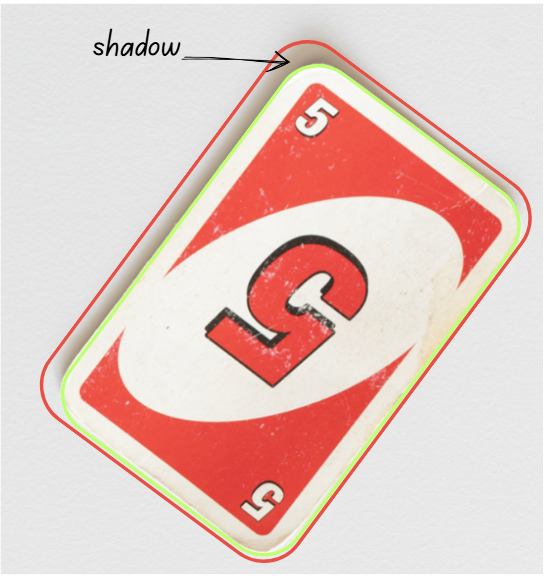

In [8]:
from IPython.display import Image

report_img_path = REPO_ROOT / "src" / "report_images" / "shadow_card.png"

Image(filename=str(report_img_path), width=300)

### 4.1 End-to-end stage preview

The next figure follows one labelled training image through the same segmentation, instance extraction, classification, and region-assignment path used by `main.py`.

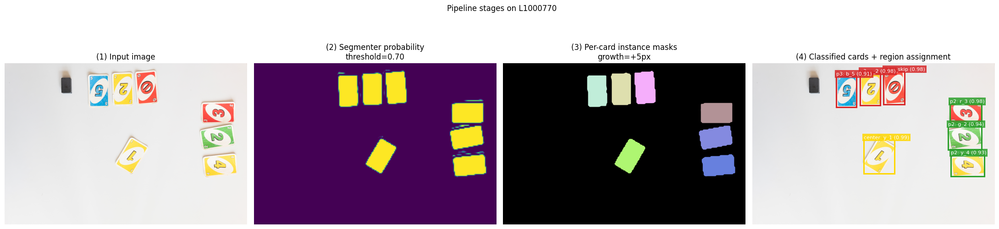

In [ ]:
# Pick a representative training image (replace the id with anything visual).
demo_id = "L1000770"
demo_path = TRAIN_DIR / f"{demo_id}.jpg"
demo_state = predict_from_path(engine, demo_path)
demo_img = cv2.imread(str(demo_path), cv2.IMREAD_COLOR)

plot_pipeline_stages(engine, demo_img, demo_state.cards, title=f"Pipeline stages on {demo_id}")

## 5. Card Classifier Training and Diagnostics

> The classifier uses a compact randomly initialized residual network with a 4-channel input: normalized RGB plus the binary card mask. We created it's training curriculum in two separate stages, we found out that training for very few epoch on the augmented cards themselves actually gave a large headstarts for the later training on the scenes themselves. We are able to shorten the scene trainin by 10-15 epoch by training 2 epoch on individual cards.

In [ ]:
RUN_CLASSIFIER_TRAINING = True

classifier_config = ClassifierPipelineConfig()

if RUN_CLASSIFIER_TRAINING:
    classifier_state = run_full_classifier_training(classifier_config, project_root=REPO_ROOT, models_dir=MODELS_DIR)
    engine = load_engine(MODELS_DIR, config=InferenceConfig(), verbose=True)
    plot_stage_preview(classifier_state, samples_per_stage=2, seed=42)
    plot_classifier_training_curves(classifier_state)   
elif GENERATED_AUGMENTED_CARDS.exists():
    classifier_summary = summarize_classifier_training(MODELS_DIR, REPO_ROOT)
    print_classifier_summary(classifier_summary)
    print("Set RUN_CLASSIFIER_TRAINING=True to rerun the two-stage classifier curriculum and rewrite the classifier bundle.")
else:
    print("Generate augmented cards and scenes first, then set RUN_CLASSIFIER_TRAINING=True to train the classifier.")

Classifier: resnet18_small (rgb_plus_mask_channel), 54 classes, 9,853,134 params.
Checkpoint: val_acc=0.856, selection=0.845, best=stage2_scene_manual_masks/epoch 85, val_samples=32,344.
Set RUN_CLASSIFIER_TRAINING=True to rerun the two-stage classifier curriculum and rewrite the classifier bundle.


Processing image: L1000863.jpg
Successfully processed scene! Detected 9 card components.


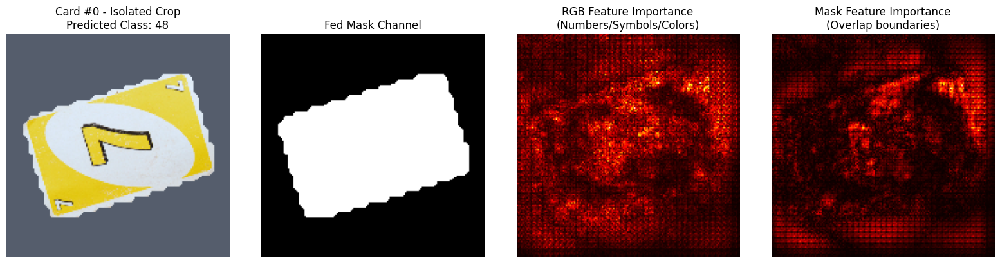

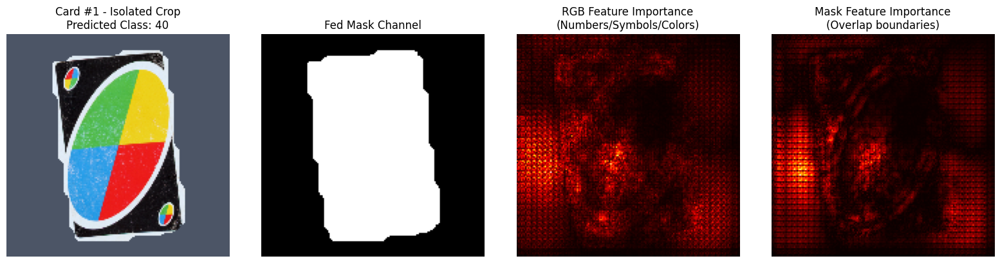

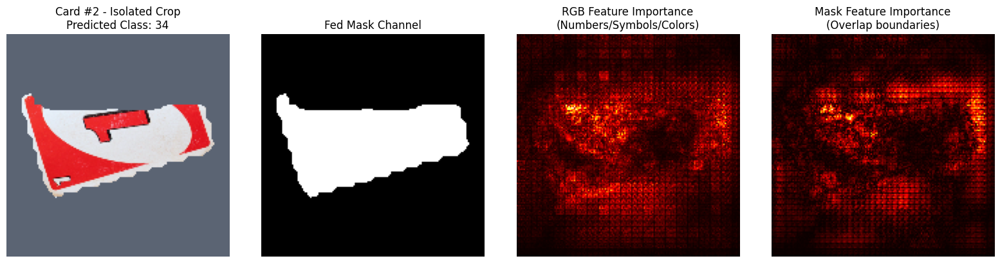

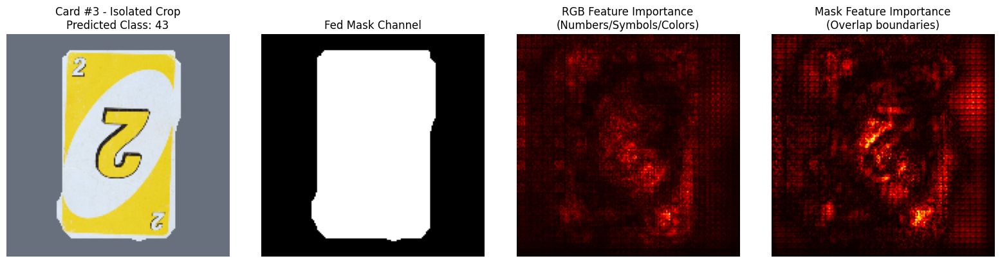

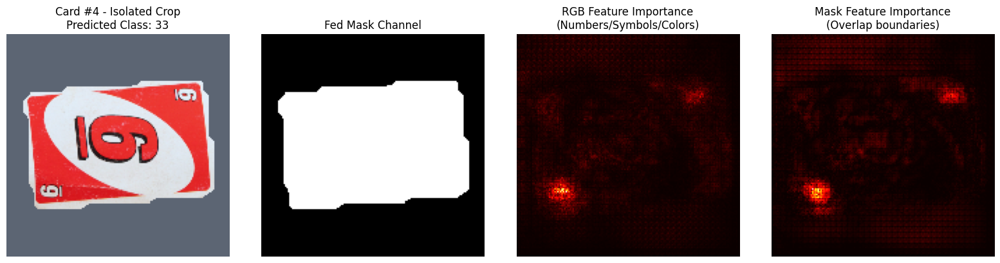

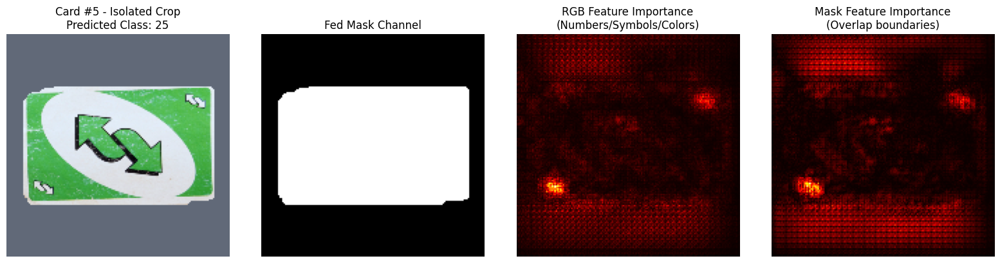

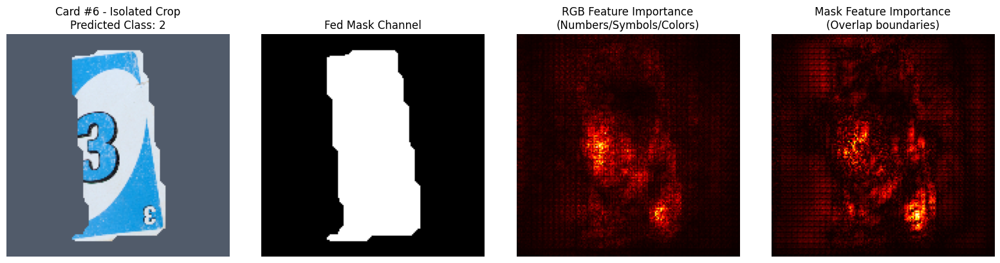

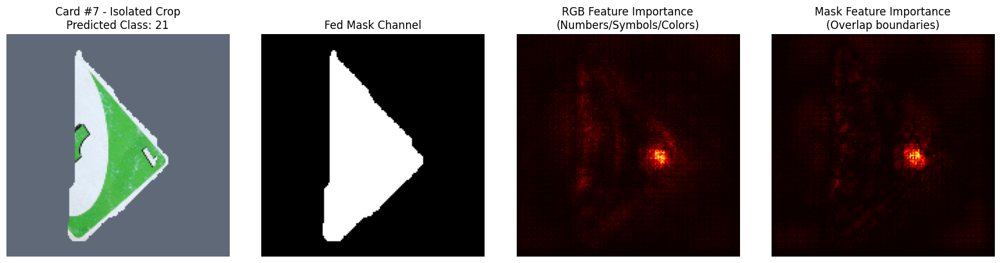

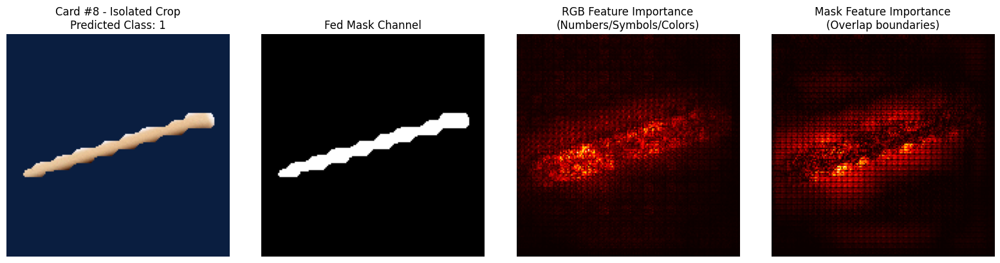

In [10]:
from pathlib import Path
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from src.inference import predict_from_path

CUSTOM_IMAGE_PATH = TEST_DIR / "L1000863.jpg" 


img_path = Path(CUSTOM_IMAGE_PATH)
if not img_path.exists():
    raise FileNotFoundError(f"Could not find the specified image at: {img_path.resolve()}")

classifier_model = None
for attr_name in dir(engine):
    attr = getattr(engine, attr_name, None)
    if isinstance(attr, torch.nn.Module) and "classifier" in attr_name.lower():
        classifier_model = attr
        break
if classifier_model is None:
    for attr_name in dir(engine):
        attr = getattr(engine, attr_name, None)
        if isinstance(attr, torch.nn.Module) and "segment" not in attr_name.lower():
            classifier_model = attr
            break
if classifier_model is None:
    raise ValueError("Could not find the classifier network within the 'engine' object.")

# Set up hooks to capture the 4-channel tensors generated for the classifier
captured_inputs = []
captured_predictions = []

def hook_fn(module, field_input, field_output):
    if len(field_input) > 0:
        captured_inputs.append(field_input[0].detach().cpu())
    captured_predictions.append(field_output.detach().cpu())

hook_handle = classifier_model.register_forward_hook(hook_fn)

# Run the full pipeline inference (Segmentation -> Instance Extraction -> Classification)
print(f"Processing image: {img_path.name}")
try:
    demo_state = predict_from_path(engine, img_path)
finally:
    # Always remove the hook to prevent residual memory overhead
    hook_handle.remove()

print(f"Successfully processed scene! Detected {len(captured_inputs)} card components.")

# 6. Put classifier in evaluation mode and prepare for gradient tracking
classifier_model.eval()
device = next(classifier_model.parameters()).device

# 7. Compute gradients (Saliency maps) for each detected card crop
for idx, (inp, out) in enumerate(zip(captured_inputs, captured_predictions)):
    # Clone input and enable gradient tracking
    inp_var = inp.clone().requires_grad_(True)
    
    with torch.set_grad_enabled(True):
        logits = classifier_model(inp_var.to(device))
        pred_class = logits.argmax(dim=1).item()
        
        # Isolate the logit score for the predicted class and backpropagate
        score = logits[0, pred_class]
        score.backward()
    
    # Extract gradient map and input data arrays
    saliency = inp_var.grad.cpu().numpy()[0]   # Shape: (4, H, W)
    input_np = inp.numpy()[0]                  # Shape: (4, H, W)
    
    # Isolate absolute gradients across features
    rgb_saliency = np.max(np.abs(saliency[:3]), axis=0)  # Channels 0,1,2 (RGB color/texture)
    mask_saliency = np.abs(saliency[3])                  # Channel 3 (Segmented binary shape)
    
    # Re-normalize inputs back to [0, 1] bounds for display
    rgb_img = input_np[:3].transpose(1, 2, 0)
    rgb_img = (rgb_img - rgb_img.min()) / (rgb_img.max() - rgb_img.min() + 1e-8)
    mask_img = input_np[3]
    
    # 8. Plot the feature importance visualization dashboard
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    # Original Cropped Image
    axes[0].imshow(rgb_img)
    axes[0].set_title(f"Card #{idx} - Isolated Crop\nPredicted Class: {pred_class}")
    axes[0].axis('off')
    
    # Extracted Binary Mask
    axes[1].imshow(mask_img, cmap='gray')
    axes[1].set_title("Fed Mask Channel")
    axes[1].axis('off')
    
    # Where the network looked on the RGB image
    axes[2].imshow(rgb_saliency, cmap='hot')
    axes[2].set_title("RGB Feature Importance\n(Numbers/Symbols/Colors)")
    axes[2].axis('off')
    
    # Where the network looked on the Shape Mask boundary
    axes[3].imshow(mask_saliency, cmap='hot')
    axes[3].set_title("Mask Feature Importance\n(Overlap boundaries)")
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()

## 6. Region Assignment Geometry

> Per R6, player positions are fixed: p1=bottom, p2=right, p3=top, p4=left. We map each card-box centroid to the nearest player edge, with a central rectangle reserved for the table card. This step is deterministic and does not use test-set tuning.

> The diagram below makes the partition explicit.

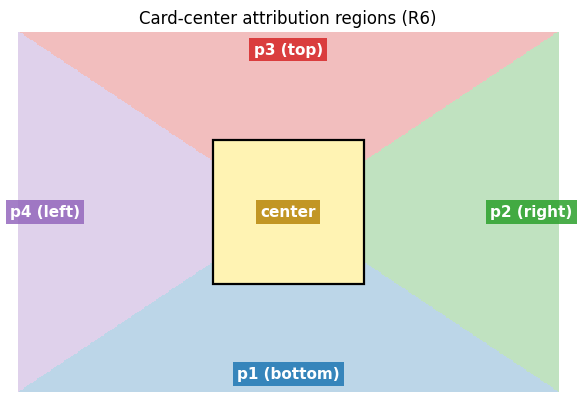

In [ ]:
plot_region_layout()

## 7. Active Player Detection

> The active player is recovered from the visible turn token before assembling the final row. Plain white-background scenes use the dark rectangular token detector, while textured-background scenes use the yellow round token detector. After the token center is found, the same fixed p1/p2/p3/p4 table layout maps it to a player label.

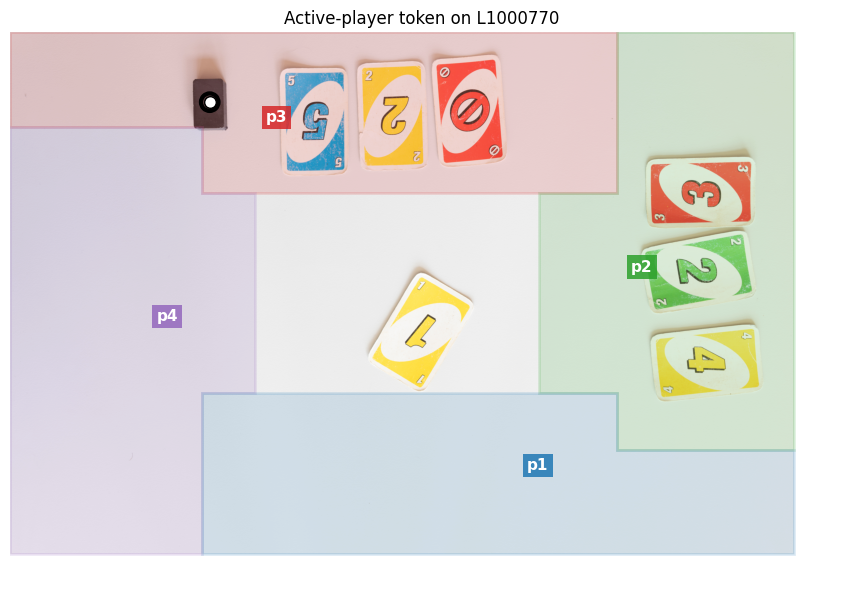

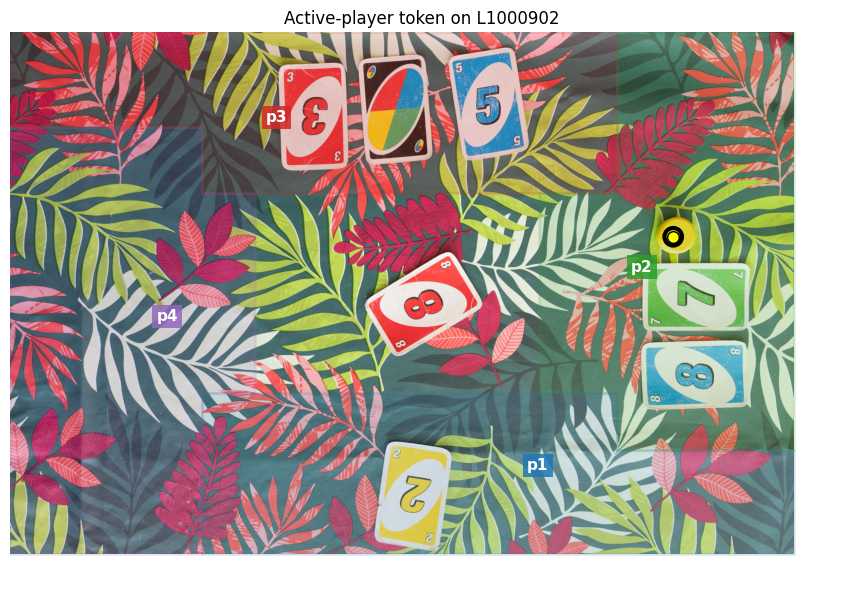

Active-player detector: accuracy=0.988, unknown=1, by token/background: dark rectangle=1.000 (42), yellow disk=0.974 (39).


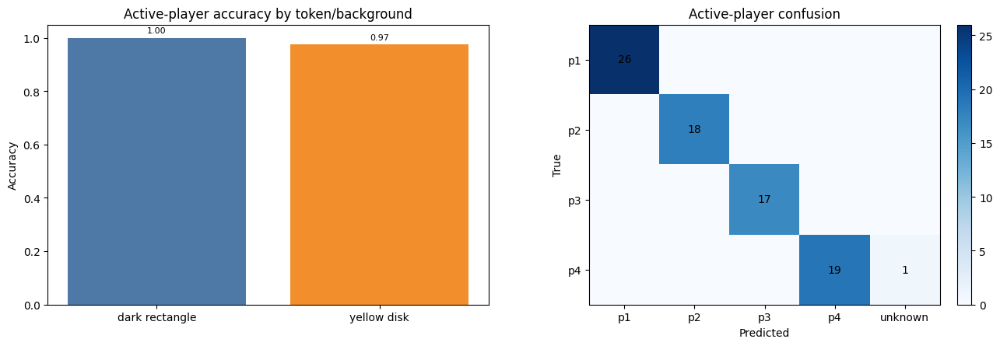

In [ ]:
active_examples = ["L1000770", "L1000902"]
active_labels = pd.read_csv(TRAIN_CSV).set_index("image_id")

for active_demo_id in active_examples:
    active_demo_path = TRAIN_DIR / f"{active_demo_id}.jpg"
    active_demo_img = cv2.imread(str(active_demo_path), cv2.IMREAD_COLOR)
    expected_player = active_labels.loc[active_demo_id, "active_player"]
    plot_active_player_detection(
        active_demo_img,
        expected_player=expected_player,
        title=f"Active-player token on {active_demo_id}",
    )

active_summary = summarize_active_player_detection(TRAIN_CSV, TRAIN_DIR)
print_active_player_summary(active_summary)
plot_active_player_summary(active_summary)

## 8. Quantitative Evaluation

> We score the structured game state locally with center-card accuracy, active-player accuracy, and bag F1 for each player hand. This is close to the competition target: it rewards recovering the active turn marker and the right multiset of cards while ignoring hand order.

### 8.1 Held-out benchmark on labelled training images

> We use `run_labeled_benchmark` from `src.report_viz`, which evaluates the full inference pipeline on the official `train.csv` rows and plots the report figures.

Benchmark: 81 labelled images, segmenter threshold=0.70.
Benchmark summary: center=0.988, active=0.988, player_macro=0.876, overall=0.913, strict=0.918, count_MAE=0.11, cards pred/true=630/627.
Weakest labelled images: L1000975=0.60, L1000966=0.67, L1000983=0.67, L1000847=0.71.
Top labelled images: L1000770=1.00, L1000771=1.00, L1000772=1.00, L1000773=1.00.


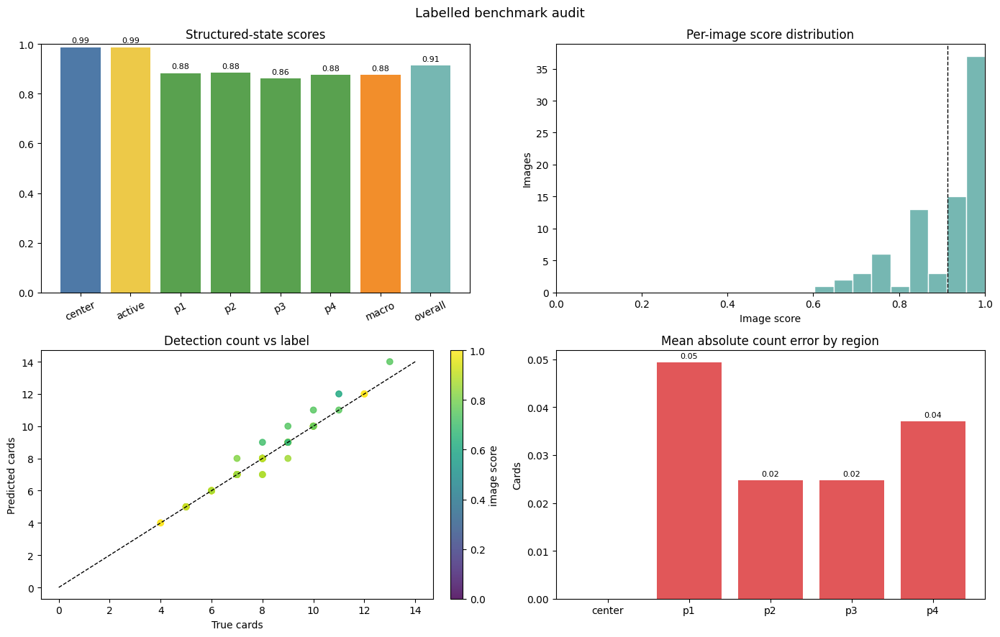

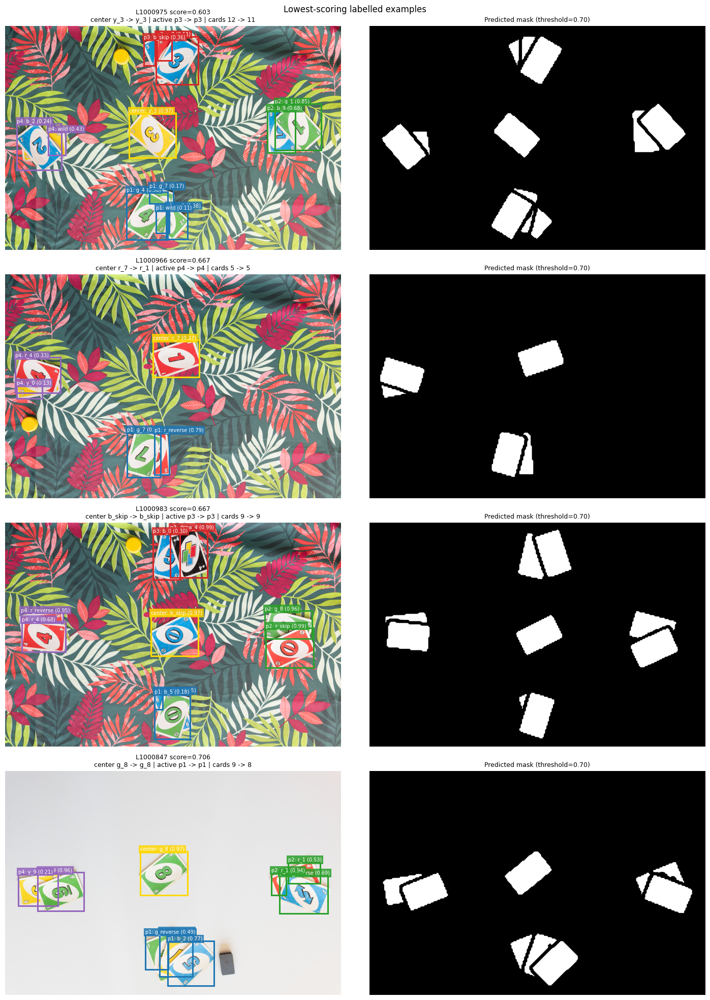

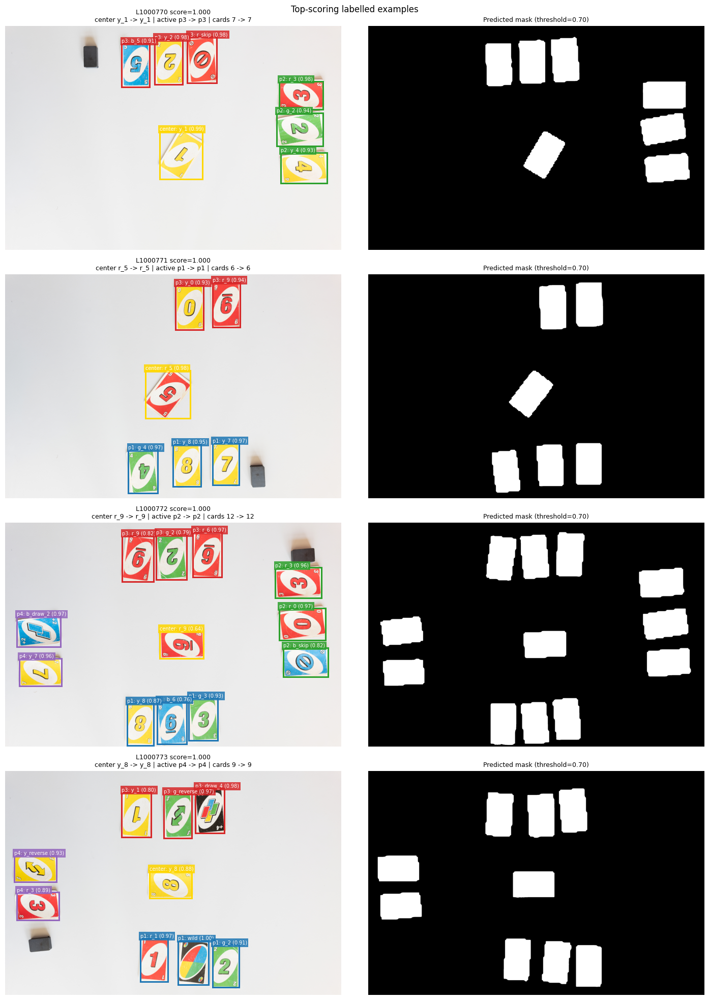

In [ ]:
# Use eval_max_images=None for the full labelled-train reproduction.
benchmark = run_labeled_benchmark(
    engine,
    TRAIN_CSV,
    TRAIN_DIR,
    BenchmarkConfig(
        eval_max_images=None,
        eval_random_subset=True,
        eval_seed=42,
        worst_k=4,
        top_k=4,
    ),
)

> The benchmark dashboard separates the main error sources: structured-state scores show whether center-card or hand recovery dominates, the score histogram shows consistency across labelled scenes, and the count panels reveal whether errors come from missing/extra detections or from region assignment. The two qualitative galleries show the lowest-scoring and top-scoring labelled examples; each row pairs the annotated prediction image with the binary predicted segmentation mask so segmentation errors can be compared directly against the final labels.

## 9. Inference-Only Test Set Audit

> We run the final pipeline on every test image only for inference and submission generation. The dashboard below is a sanity check of the predictions before writing the CSV: confidence, total detections, region counts, and the most frequent predicted card classes.

test inference:   0%|          | 0/159 [00:00<?, ?it/s]

Prediction audit: 159 images, 1174 cards, mean cards/image=7.38, mean confidence=0.807.


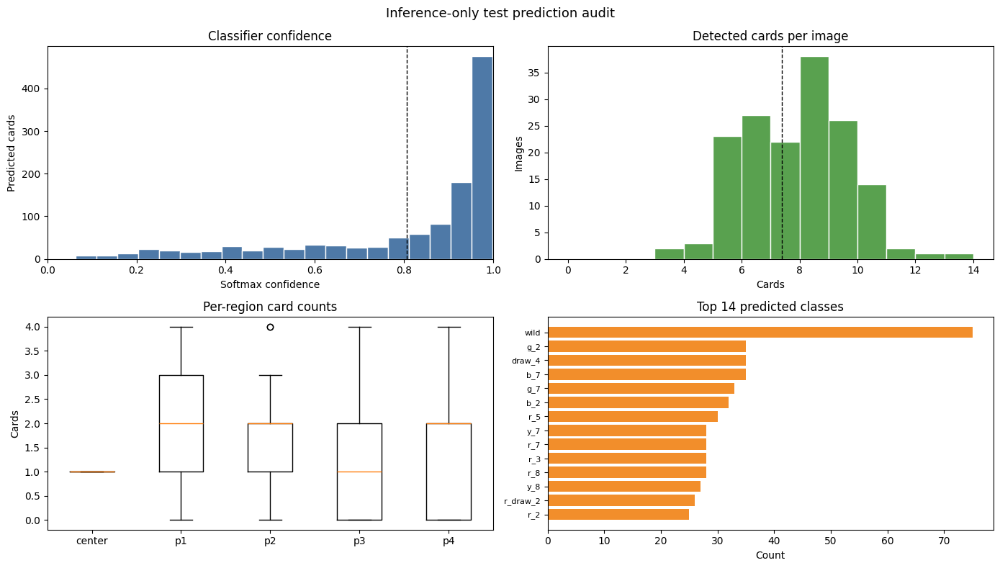

In [ ]:
test_paths = sorted(TEST_DIR.glob("*.jpg"))
test_states = [predict_from_path(engine, path) for path in tqdm(test_paths, desc="test inference")]

test_summary = summarize_prediction_set(test_states)
print_prediction_set_summary(test_summary)
plot_prediction_set_diagnostics(test_summary, top_n=14)

## 10. Reproducing the Kaggle Submission

> As asked, the submission CSV uploaded to Kaggle is produced by:

```bash
python main.py
```

> The cell below writes the same schema from the already-computed test predictions so the notebook contains a self-contained reproduction check.

In [ ]:
submission_path = write_submission(test_states, REPO_ROOT / "submission.csv", validate=True)
print(f"Wrote {submission_path.relative_to(REPO_ROOT)} with {len(test_states)} rows.")
pd.read_csv(submission_path).head()

Wrote submission.csv with 159 rows.


,image_id,center_card,active_player,player_1_cards,player_2_cards,player_3_cards,player_4_cards
0,L1000793,g_0,p2,EMPTY,r_6;r_reverse;g_4,r_9;y_5;b_6,y_0;g_5;r_5
1,L1000794,y_7,p1,r_skip;y_9,EMPTY,g_7;b_0;r_2,EMPTY
2,L1000795,y_8,p1,g_2;r_skip;wild,EMPTY,EMPTY,r_5;draw_4;b_7;y_0
3,L1000796,b_2,p1,b_skip;g_6,wild;g_1;g_draw_2,y_6;b_7,g_6;r_5
4,L1000797,y_0,p2,EMPTY,r_7;y_5,EMPTY,wild


## 11. Limitations and Future Work

> Classification is clearly the bottleneck of our implementation. A better implementation would have created rectangular mask fitting in order to; first, connect cards component that might be split by overlaying cards, second, allows to focus the attention of the classifier on specific locations on the cards.
> This would have allowed to train the classifier specifically on the corner part of the cards (which would have been easily located if we could recreate the complete rectangular shape of each cards, even the ones partially obstructed), which are usually the only visible part of the cards when strong overlaps occurs. This would have made classification much more reliable in more complex scenarios.